# P5. Vehicle Detection and Tracking Project

The goals / steps of this project are the following:

* Perform a Histogram of Oriented Gradients (HOG) feature extraction on a labeled training set of images and train a classifier Linear SVM classifier
* Optionally, you can also apply a color transform and append binned color features, as well as histograms of color, to your HOG feature vector. 
* Note: for those first two steps don't forget to normalize your features and randomize a selection for training and testing.
* Implement a sliding-window technique and use your trained classifier to search for vehicles in images.
* Run your pipeline on a video stream (start with the test_video.mp4 and later implement on full project_video.mp4) and create a heat map of recurring detections frame by frame to reject outliers and follow detected vehicles.
* Estimate a bounding box for vehicles detected.


In [1]:
### ALL NECESSARY IMPORTS ###

import os
import glob
import numpy as np
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import cv2
import time

from skimage.feature import hog
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split

from moviepy.editor import VideoFileClip




## Step 1. Make a list of images to read in

In [2]:

# Training images are divided up into Vehicles and Non-Vehicles folders. 

## LOADING VEHICLE IMAGES ##
# First, locate vehicles images
basedir = 'vehicles/'

#Load the subfolders from different sources for images:
image_sources = os.listdir(basedir)

vehicles = []

for imtype in image_sources:
    vehicles.extend(glob.glob(basedir+imtype+'/*'))
    
print('Number of Vehicle-class Images loaded:', len(vehicles))

#Store the vehicle filenames in a text file
with open("vehicles.txt", 'w') as f:
    for fn in vehicles:
        f.write(fn+'\n')

## LOADING NON-VEHICLE IMAGES ##
# Repeat same process for non-vehicles
basedir = 'non-vehicles/'

#Load the subfolders from different sources for images:
image_sources = os.listdir(basedir)

nonvehicles = []


for imtype in image_sources:
    nonvehicles.extend(glob.glob(basedir+imtype+'/*'))
    
print('Number of Non-Vehicle-class Images loaded:', len(nonvehicles))

#Store the vehicle filenames in a text file
with open("non-vehicles.txt", 'w') as f:
    for fn in nonvehicles:
        f.write(fn+'\n')

    

Number of Vehicle-class Images loaded: 8792
Number of Non-Vehicle-class Images loaded: 8968


### Visualize samples of the Loaded Data

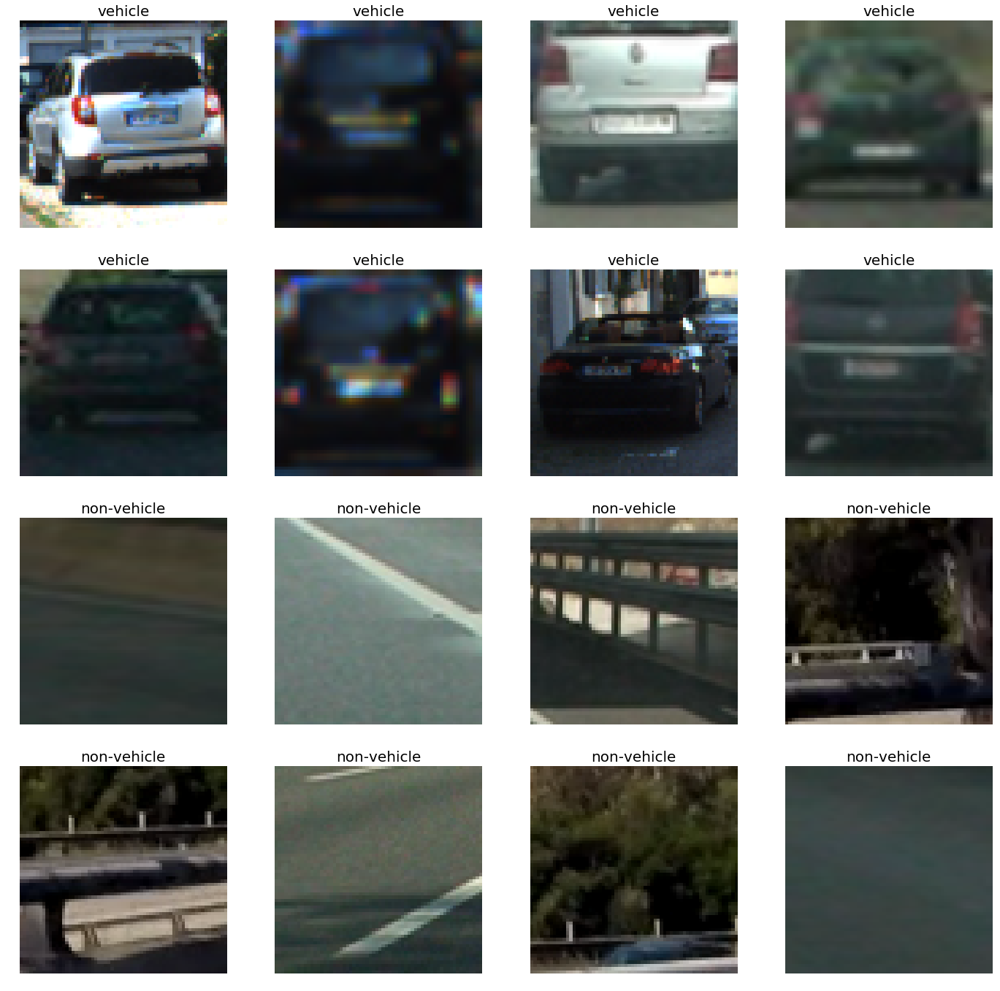

In [33]:
fig, axs = plt.subplots(4,4, figsize=(24, 24))

axs = axs.ravel()

# Step through the list and search for chessboard corners
for i in np.arange(8):
    img = cv2.imread(vehicles[np.random.randint(0,len(vehicles))])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('vehicle', fontsize=20)
    axs[i].imshow(img)
for i in np.arange(8,16):
    img = cv2.imread(nonvehicles[np.random.randint(0,len(nonvehicles))])
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)
    axs[i].axis('off')
    axs[i].set_title('non-vehicle', fontsize=20)
    axs[i].imshow(img)

## 2. Define Processing Functions

In [3]:
def get_hog_features(img, orient, pix_per_cell, cell_per_block, 
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient, 
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block), 
                                  transform_sqrt=False, 
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:      
        features = hog(img, orientations=orient, 
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), 
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features

In [4]:
def bin_spatial(img, size=(32, 32)):
    color1 = cv2.resize(img[:,:,0], size).ravel()
    color2 = cv2.resize(img[:,:,1], size).ravel()
    color3 = cv2.resize(img[:,:,2], size).ravel()
    
    return np.hstack((color1, color2, color3))

In [5]:
def color_hist(img, nbins=32):    #bins_range=(0, 256)
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

In [6]:
# Define a function to extract features from a single image window
# This function is very similar to extract_features()
# just for a single image rather than list of images
def single_img_features(img, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True, vis=False):    
    #1) Define an empty list to receive features
    img_features = []
    #2) Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(img, cv2.COLOR_RGB2YCrCb)
    else: feature_image = np.copy(img)      
    
    #3) Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(feature_image, size=spatial_size)
        #4) Append features to list
        img_features.append(spatial_features)
        
    #5) Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(feature_image, nbins=hist_bins)
        #6) Append features to list
        img_features.append(hist_features)
    
    #7) Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel == 'ALL':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                hog_features.extend(get_hog_features(feature_image[:,:,channel], 
                                    orient, pix_per_cell, cell_per_block, 
                                    vis=False, feature_vec=True))      
        else:
            if vis == True:
                hog_features, hog_image = get_hog_features(feature_image[:,:,hog_channel], orient, 
                                                pix_per_cell, cell_per_block, vis=True, feature_vec=True)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                                                pix_per_cell, cell_per_block, vis=False, feature_vec=True)
        #8) Append features to list
        img_features.append(hog_features)

    #9) Return concatenated array of features
    if vis == True:
        return np.concatenate(img_features), hog_image
    else:
        return np.concatenate(img_features)

In [7]:
# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                        hist_bins=32, orient=9, 
                        pix_per_cell=8, cell_per_block=2, hog_channel=0,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)      

        if spatial_feat == True:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == True:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == True:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel], 
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)        
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient, 
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

In [8]:
# Define a function that takes an image,
# start and stop positions in both x and y, 
# window size (x and y dimensions),  
# and overlap fraction (for both x and y)
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None], 
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    # If x and/or y start/stop positions not defined, set to image size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched    
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step) 
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step) 
    # Initialize a list to append window positions to
    window_list = []
    # Loop through finding x and y window positions
    # Note: you could vectorize this step, but in practice
    # you'll be considering windows one by one with your
    # classifier, so looping makes sense
    for ys in range(ny_windows):
        for xs in range(nx_windows):
            # Calculate window position
            startx = xs*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = ys*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list

In [9]:
# Define a function you will pass an image 
# and the list of windows to be searched (output of slide_windows())
def search_windows(img, windows, clf, scaler, color_space='RGB', 
                    spatial_size=(32, 32), hist_bins=32, 
                    hist_range=(0, 256), orient=9, 
                    pix_per_cell=8, cell_per_block=2, 
                    hog_channel=0, spatial_feat=True, 
                    hist_feat=True, hog_feat=True):

    #1) Create an empty list to receive positive detection windows
    on_windows = []
    #2) Iterate over all windows in the list
    for window in windows:
        #3) Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        #4) Extract features for that window using single_img_features()
        features = single_img_features(test_img, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        #5) Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        #6) Predict using your classifier
        prediction = clf.predict(test_features)
        #7) If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
    #8) Return windows for positive detections
    return on_windows


In [10]:
# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy


In [11]:
# Function for plotting multiple images
def visualize(fig, rows, cols, imgs, titles):
    for i, img in enumerate(imgs):
        plt.subplot(rows, cols, i+1)
        plt.title(i+1)
        img_dims = len(img.shape)
        if img_dims < 3 :
            plt.imshow(img, cmap ='hot')
            plt.title(titles[i])
        else:
            plt.imshow(img)
            plt.title(titles[i])        

In [12]:
def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap

In [13]:
def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap



In [14]:
def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    copy_img = np.copy(img)
    bboxes = []
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        
        bboxes.append(bbox)
        # Draw the box on the image, value of 255 squared since image is divided by 255 
        # to be scaled between 0 and 1
        cv2.rectangle(copy_img, bbox[0], bbox[1], (0,0,255**2), 6)
        
        
    # Return the image
    return copy_img

## 3. Let's test the Functions on some training images

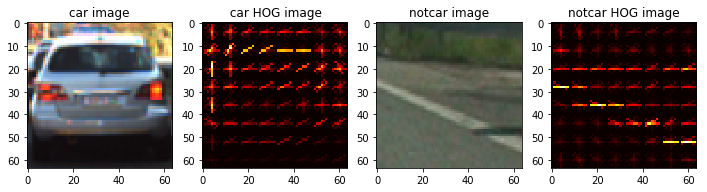

In [67]:
%matplotlib inline

# Choose random car / not-car indices
car_ind = np.random.randint(0, len(vehicles))
notcar_ind = np.random.randint(0, len(nonvehicles))

# Define in car / not-car images
car_image = mpimg.imread(vehicles[car_ind])
notcar_image = mpimg.imread(nonvehicles[notcar_ind])

# Define feature parameters
color_space = 'YUV' # can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 6
pix_per_cell = 8
cell_per_block = 2
hog_channel = 0 # can be 0, 1, 2, or "ALL"

spatial_size = (16, 16)  # spatial binning dimensions
hist_bins = 16  # number of histogram bins
spatial_feat = True # spatial features on or off
hist_feat = True # histogram features on or off
hog_feat = True # HOG features on or off

car_features, car_hog_image = single_img_features(car_image, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient, pix_per_cell=pix_per_cell, cell_per_block=cell_per_block,
                        hog_channel=hog_channel, spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat,
                        vis = True)

notcar_fetures, notcar_hog_image = single_img_features(notcar_image, color_space=color_space, spatial_size=spatial_size,
                        hist_bins=hist_bins, orient=orient, 
                        pix_per_cell=pix_per_cell, cell_per_block=cell_per_block, hog_channel=hog_channel,
                        spatial_feat=spatial_feat, hist_feat=hist_feat, hog_feat=hog_feat,
                        vis = True)

images = [car_image, car_hog_image, notcar_image, notcar_hog_image]
titles = ['car image', ' car HOG image', 'notcar image', 'notcar HOG image']
fig = plt.figure(figsize=(12,3))#, dpi=80)
visualize(fig, 1, 4, images, titles)




## Classifier Function

In [16]:
# function to train classifier
def train_classifier(cars,notcars,color_space,orient, pix_per_cell, cell_per_block, hog_channel, spatial_size,
                    hist_bins, spatial_feat, hist_feat, hog_feat):
 
    # extract car and non-car features
    car_features = extract_features(cars, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
    notcar_features = extract_features(notcars, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
    
    # combine features
    X = np.vstack((car_features, notcar_features)).astype(np.float64)                        
    
    # Fit a per-column scaler
    X_scaler = StandardScaler().fit(X)
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)

    # Define the labels vector
    y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))


    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(
        scaled_X, y, test_size=0.2, random_state=rand_state)

    print('Using:',orient,'orientations',pix_per_cell,
        'pixels per cell and', cell_per_block,'cells per block')
    print('Feature vector length:', len(X_train[0]))
    # Use a linear SVC 
    svc = LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    # Check the score of the SVC
    print('Test Accuracy of SVC = ', round(svc.score(X_test, y_test), 4))
    # Check the prediction time for a single sample
    t=time.time()
    return svc, X_scaler

## Run the Classifier

In [55]:
# parameters to pass to functions 
color_space = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
orient = 6  # HOG orientations
pix_per_cell = 8 # HOG pixels per cell
cell_per_block = 2 # HOG cells per block
hog_channel = "ALL" # Can be 0, 1, 2, or "ALL"
spatial_size = (16, 16) # Spatial binning dimensions
hist_bins = 32    # Number of histogram bins
spatial_feat = True # Spatial features on or off
hist_feat = True # Histogram features on or off
hog_feat = True # HOG features on or off

# perform classifier training
my_svc, X_scaler = train_classifier(vehicles,nonvehicles,color_space,orient, pix_per_cell, cell_per_block, hog_channel, spatial_size,
                    hist_bins, spatial_feat, hist_feat, hog_feat)



Using: 6 orientations 8 pixels per cell and 2 cells per block
Feature vector length: 4392
20.25 Seconds to train SVC...
Test Accuracy of SVC =  0.9901


## Design a multi-scale Sliding Window Set (Full-Scan)

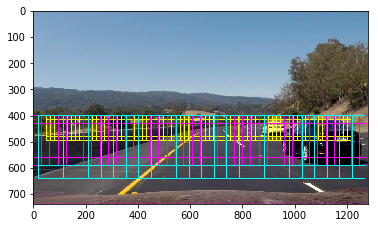

In [61]:
img = mpimg.imread('./test_images/test7.jpg')

y_start_stop = [400, 500] # Min and max in y to search in slide_window()
x_start_stop=[50, 1230]
xy_window = (64,64)
xy_overlap = (0.75,0.75)

windows_1 = slide_window(img, x_start_stop=x_start_stop, y_start_stop=y_start_stop, 
                           xy_window=xy_window, xy_overlap=xy_overlap)

im_to_save = draw_boxes(img, windows_1, color=(255, 255, 0), thick=2)


y_start_stop = [400, 600] # Min and max in y to search in slide_window()
x_start_stop=[0, 1280]
xy_window = (128,128)
xy_overlap = (0.75,0.75)

windows_2 = slide_window(img, x_start_stop=x_start_stop, y_start_stop=y_start_stop, 
                           xy_window=xy_window, xy_overlap=xy_overlap)

im_to_save = draw_boxes(im_to_save, windows_2, color=(255, 0, 255), thick=2)

y_start_stop = [400, 650] # Min and max in y to search in slide_window()
x_start_stop=[20, 1280]
xy_window = (192,192)
xy_overlap = (0.75,0.75)

windows_3 = slide_window(img, x_start_stop=x_start_stop, y_start_stop=y_start_stop, 
                           xy_window=xy_window, xy_overlap=xy_overlap)

im_to_save = draw_boxes(im_to_save, windows_3, color=(0, 255, 255), thick=2)

plt.imshow(im_to_save)
plt.show()

r,g,b = cv2.split(im_to_save)
im_to_save_rgb = cv2.merge((b,g,r))
    
write_name = './output_images/sliding' + '.jpg'
cv2.imwrite(write_name, im_to_save_rgb)
    

windows = windows_1  + windows_2 + windows_3

In [62]:
print(len(windows))

367


## Dynamic Sliding Window Set (Local Scan)

In [37]:
from scipy.ndimage.measurements import label

###################################################################################################
# This function defines a sliding window set in the local area around the provided labelled objects.
###################################################################################################
def get_local_search_windows(img, labels):
    local_windows = []
    
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox_x = (np.min(nonzerox), np.max(nonzerox))
        bbox_y = (np.min(nonzeroy), np.max(nonzeroy))
        
        # We will base the calculations of the relative size of the local area on the vertical size of the label,
        # because it's more stable than the horizontal size.
        rel_size = bbox_y[1]-bbox_y[0]
        
        rel_size = max(rel_size,16)
        rel_sizex = int(1.2 * rel_size)

        # Center of the local area to draw
        center = ((bbox_x[0]+bbox_x[1])//2, (bbox_y[0]+bbox_y[1])//2)
        
        # X,Y max and min of the sliding window local area to draw.
        y_start_stop = [center[1]-rel_size, center[1]+rel_size] # Min and max in y to search in slide_window()
        x_start_stop = [center[0]-rel_sizex, center[0]+rel_sizex]

        # We ensure that the sliding window are does not go beyond the region of interest of the image.
        y_start_stop = np.clip(y_start_stop, 390,660)
        x_start_stop = np.clip(x_start_stop, 0, 1280)

        # Define the size of the windows, with a maximum size of 160x160
        xy_window = (min(rel_size,160),min(rel_size,160))

        # Window overlapping.
        xy_overlap = (0.7,0.7)

        # Windows obtained in this iteration (for one label blob)
        iter_windows = slide_window(img, x_start_stop=x_start_stop, y_start_stop=y_start_stop, 
                           xy_window=xy_window, xy_overlap=xy_overlap)
       
        # Accumulate widndows for different labels.
        local_windows = local_windows + iter_windows
    
    return local_windows

In [46]:
def image_pipeline(img):
    
    
    # scale pixel values to be between 0 and 1
    # This is because the training PNG images were loaded like that,
    # and the test images are JPEG between 0 and 255
    image = img.astype(np.float32)/255
    

    detected_windows = search_windows(image, windows, my_svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)

    
    aux_img = draw_boxes(image, detected_windows, color=(0, 0, 255**2), thick=3)
        
    # Add heat to each box in box list
    heat = np.zeros_like(image[:,:,0]).astype(np.float)
    heat = add_heat(heat,detected_windows)

    # apply threshold to remove false positives and visualize the heatmap when displaying
    heat = apply_threshold(heat, 1 )
    
    heatmap = np.clip(heat, 0, 255)

    
    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    #print(labels)
    # create a copy of image to return
    draw_img = np.copy(image)
    
    # append bounding boxes to image copy
    draw_img = draw_labeled_bboxes(draw_img, labels)
    
    return heatmap, aux_img,draw_img,labels 

## Testing the single frame Pipeline

Note that the Single Frame Pipeline does not really use the LOCAL Sliding Window Search, but a FULL scan in the region of the interest. However, for illustration purposes, the local sliding windows to be used in the next frame are shown on top of the result.

In [63]:
%matplotlib inline

searchpath = 'test_images/*'

example_images = glob.glob(searchpath)

plot_images = []
titles = []

for idx, img_src in enumerate(example_images):
    t1 = time.time()
    img = mpimg.imread(img_src)
    draw_img = np.copy(img)
    
    heatmap, res_windows, res_boxes, lbls = image_pipeline(img)
    
    print(time.time()-t1, 'seconds to process one image searching', len(windows), 'windows')
    
    im_to_save = res_boxes * 255
    r,g,b = cv2.split(im_to_save)
    im_to_save = cv2.merge((b,g,r))
    
    ########
    if (len(lbls)>0):
        localw = get_local_search_windows(img,lbls)
        im_to_save = draw_boxes(im_to_save, localw, color=(200, 200, 200), thick=2)
    ########
    
    write_name = './output_images/boxes' + str(idx+1) + '.jpg'
    cv2.imwrite(write_name, im_to_save)
    
    #plot_images.append(lbls[0])
    #titles.append('')
    
    #plot_images.append(res_boxes)
    #titles.append('')
    
    #plt.imshow(heatmap, cmap = 'hot')
    #plt.show()
    plot_images.append(heatmap)
    titles.append('heatmap')
    
    #plt.imshow(lbls[0], cmap = 'gray')
    #plt.show()
    plot_images.append(lbls[0])
    titles.append('blobs-labels')
    
    #plt.imshow(res_boxes)
    #plt.show()
    plot_images.append(res_boxes)
    titles.append('detections')

fig = plt.figure(figsize=(12,18), dpi=600)
visualize(fig,7,3, plot_images, titles)


1.8320138454437256 seconds to process one image searching 367 windows
2.1575582027435303 seconds to process one image searching 367 windows
2.175132989883423 seconds to process one image searching 367 windows
1.9810090065002441 seconds to process one image searching 367 windows
1.971139907836914 seconds to process one image searching 367 windows
1.9340519905090332 seconds to process one image searching 367 windows
2.154381036758423 seconds to process one image searching 367 windows


"\nfig = plt.figure(figsize=(10,10))\nplt.subplot(3,1,1)\ntest = plt.imread('test_images/test2.jpg\n')\ntest_out,lbs = image_pipeline(test)\nplt.imshow(test_out)\nplt.subplot(3,1,2)\ntest = plt.imread('test_images/test5.jpg')\ntest_out,lbs = image_pipeline(test)\nplt.imshow(test_out)\nplt.subplot(3,1,3)\n\ntest = plt.imread('test_images/test6.jpg')\naux_img, test_out,lbs = image_pipeline(test)\nplt.imshow(aux_img)\n"

## Video Pipeline

In [40]:
class Vehicle():
    def __init__(self, smooth_factor, full_scan_period):
        self.history_windows = []
        self.smooth_n = smooth_factor
        self.n_frame = 0
        self.full_scan = full_scan_period
        self.last_labels = None
        
    def add_windows(self, wins):
        self.history_windows.append(wins)
        
        if len(self.history_windows) > self.smooth_n:
            #print("deleting")
            #del self.history_windows[ 0 : len(self.history_windows) - self.smooth_n]
            self.history_windows = self.history_windows[len(self.history_windows)-self.smooth_n :]
            #print(len(self.history_windows))

In [42]:
def video_pipeline(img):
    #_,draw_img,_ = image_pipeline(img)
    #return draw_img * 255

    # scale pixel values to be between 0 and 1
    # This is because the training PNG images were loaded like that,
    # and the test images are JPEG between 0 and 255
    image = img.astype(np.float32)/255
    
    detected_windows = []
    
    #heatmap_rgb = np.zeros_like(image).astype(np.float32)
    
    # create a copy of image to return
    draw_img = np.copy(image)
    
    #Every tracker.full_scan frames, we perform a full scan across the ROI.
    if (tracker.n_frame % tracker.full_scan) == 0 :  # or tracker.last_labels == None    
        detected_windows = search_windows(image, windows, my_svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
    
        #draw_img = draw_boxes(draw_img, detected_windows, color=(255**2, 0, 0), thick=1)
    
    #Otherwise, we perform a local search around last labelled vehicles detected.
    elif (tracker.last_labels != None):
        
        # We perform local window search around the last labels only.
        local_windows = get_local_search_windows(image, tracker.last_labels)
        
        detected_windows = search_windows(image, local_windows, my_svc, X_scaler, color_space=color_space, 
                            spatial_size=spatial_size, hist_bins=hist_bins, 
                            orient=orient, pix_per_cell=pix_per_cell, 
                            cell_per_block=cell_per_block, 
                            hog_channel=hog_channel, spatial_feat=spatial_feat, 
                            hist_feat=hist_feat, hog_feat=hog_feat)
        
        #draw_img = draw_boxes(draw_img, detected_windows, color=(255**2, 255**2, 0), thick=1)
    
    #If there are not last labelled vehicles detected, we just wait until a full scan.
    else:
        #Do nothing
        pass
        
    
    if len(detected_windows) > 0:
        tracker.add_windows(detected_windows)

        # Add heat to each box in box list
        heat = np.zeros_like(image[:,:,0]).astype(np.float32)

        for winset in tracker.history_windows:
            heat = add_heat(heat, winset)

        heat = apply_threshold(heat, 3 )

        heatmap = np.clip(heat, 0, 255)
    
        # Find final boxes from heatmap using label function
        labels = label(heatmap)
        tracker.last_labels = labels[:]

        # append bounding boxes to image copy
        draw_img = draw_labeled_bboxes(draw_img, labels)
        

        #heatmap_rgb[:,:,0] = np.clip(heatmap[:,:] * 10,0,255)
        #heatmap_rgb[:,:,1] = 0
        #heatmap_rgb[:,:,2] = 0

    
    tracker.n_frame +=1
    
    draw_img = draw_img * 255
    
    #result = cv2.addWeighted(draw_img ,0.5, heatmap_rgb, 1.0, 0.0)
    return draw_img # .astype(np.int32)

In [43]:
tracker = Vehicle(smooth_factor=7, full_scan_period = 15)

project_output = "project_video_out.mp4"
clip1 = VideoFileClip("project_video.mp4") # .subclip(25,45)
out_clip = clip1.fl_image(video_pipeline) 
%time out_clip.write_videofile(project_output, audio=False)

[MoviePy] >>>> Building video project_video_out.mp4
[MoviePy] Writing video project_video_out.mp4


100%|█████████▉| 1260/1261 [03:51<00:00,  3.78it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_out.mp4 

CPU times: user 2min 57s, sys: 25.4 s, total: 3min 22s
Wall time: 3min 53s
